In [42]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import time
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [159]:
# Root directory for dataset
dataroot = "~/data/celeba"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 3

# Learning rate for optimizers
lr = 0.0001

# Beta1 hyperparam for Adam optimizers
beta1 = 0.3

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

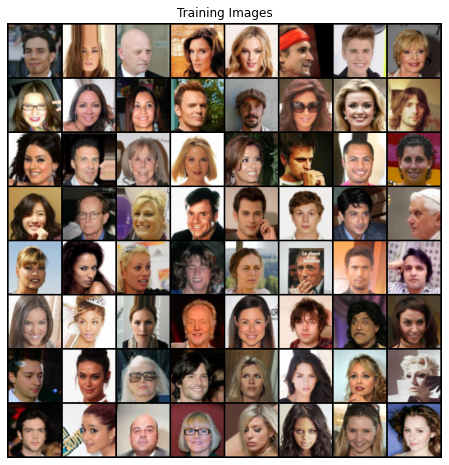

In [160]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [161]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [162]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [163]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [164]:

dcgan_generator_path = "./dcgan_generator.pt"
dcgan_discriminator_path = "./dcgan_discriminator.pt"

netG = Generator(ngpu).to(device)
netD = Discriminator(ngpu).to(device)

# Print the model
print(netG)
print(netD)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
    
# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
if os.path.exists(dcgan_generator_path) and os.path.exists(dcgan_discriminator_path):
    netG.load_state_dict(torch.load(dcgan_generator_path))
    netD.load_state_dict(torch.load(dcgan_discriminator_path))
    print('Load generator from [%s] and discriminator from [%s]' % (dcgan_generator_path, dcgan_discriminator_path))
else:
    # Apply the weights_init function to randomly initialize all weights
    #  to mean=0, stdev=0.2.
    netG.apply(weights_init)

    # Apply the weights_init function to randomly initialize all weights
    #  to mean=0, stdev=0.2.
    netD.apply(weights_init)
    print('Randomly initialize weights for models')

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [165]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [171]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

from torch.utils.tensorboard import SummaryWriter

tensorboard_logs_path = "./tensorboard_logs/dcgan"
writer = SummaryWriter(tensorboard_logs_path)

start_time = time.time()

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 10 == 0:
            print('[%d s][%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (time.time() - start_time, epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            torch.save(netG.state_dict(), dcgan_generator_path)
            torch.save(netD.state_dict(), dcgan_discriminator_path)
            print('Save generator to [%s] and discriminator to [%s]' % (dcgan_generator_path, dcgan_discriminator_path))
            
            # log example image to tensorboard
            with torch.no_grad():
                fake_images = netG(fixed_noise).detach().cpu()
                fake_image = fake_images[random.randint(0, batch_size - 1)].squeeze()
                writer.add_image('example generated image', fake_image, global_step=(epoch + 1) * (i + 1))
            # log discriminator error and generator error
            writer.add_scalar('Generator loss', errG.item(), global_step=(epoch + 1) * (i + 1))
            writer.add_scalar('Discriminator loss', errD.item(), global_step=(epoch + 1) * (i + 1))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0 s][0/3][0/3166]	Loss_D: 0.1359	Loss_G: 3.6617	D(x): 0.9390	D(G(z)): 0.0630 / 0.0379
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[2 s][0/3][10/3166]	Loss_D: 0.1524	Loss_G: 3.5187	D(x): 0.9101	D(G(z)): 0.0464 / 0.0465
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[4 s][0/3][20/3166]	Loss_D: 0.2376	Loss_G: 2.8820	D(x): 0.8243	D(G(z)): 0.0180 / 0.0873
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[6 s][0/3][30/3166]	Loss_D: 0.1057	Loss_G: 4.6395	D(x): 0.9555	D(G(z)): 0.0479 / 0.0166
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[8 s][0/3][40/3166]	Loss_D: 0.1104	Loss_G: 3.8412	D(x): 0.9242	D(G(z)): 0.0237 / 0.0330
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[10 s][0/3][50/3166]	Loss_D: 0.1606	Loss_G: 3.4455	D(x): 0.8852	D(G(z)): 0.0250 / 0.0526
S

[89 s][0/3][460/3166]	Loss_D: 0.2594	Loss_G: 6.3886	D(x): 0.9833	D(G(z)): 0.1853 / 0.0026
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[91 s][0/3][470/3166]	Loss_D: 0.2091	Loss_G: 3.0680	D(x): 0.8816	D(G(z)): 0.0691 / 0.0700
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[93 s][0/3][480/3166]	Loss_D: 0.0698	Loss_G: 4.3632	D(x): 0.9586	D(G(z)): 0.0256 / 0.0208
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[95 s][0/3][490/3166]	Loss_D: 0.1713	Loss_G: 3.2986	D(x): 0.8730	D(G(z)): 0.0240 / 0.0695
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[97 s][0/3][500/3166]	Loss_D: 0.0478	Loss_G: 4.8927	D(x): 0.9848	D(G(z)): 0.0313 / 0.0125
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[99 s][0/3][510/3166]	Loss_D: 1.4011	Loss_G: 1.0905	D(x): 0.3191	D(G(z)): 0.0161 / 0.4249
Save generator 

[178 s][0/3][920/3166]	Loss_D: 0.6303	Loss_G: 3.3519	D(x): 0.9289	D(G(z)): 0.3694 / 0.0529
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[180 s][0/3][930/3166]	Loss_D: 0.2647	Loss_G: 2.3883	D(x): 0.8363	D(G(z)): 0.0559 / 0.1343
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[182 s][0/3][940/3166]	Loss_D: 0.2132	Loss_G: 5.5380	D(x): 0.9797	D(G(z)): 0.1563 / 0.0064
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[184 s][0/3][950/3166]	Loss_D: 0.3160	Loss_G: 4.5399	D(x): 0.9269	D(G(z)): 0.1710 / 0.0224
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[186 s][0/3][960/3166]	Loss_D: 0.1567	Loss_G: 3.8749	D(x): 0.9066	D(G(z)): 0.0451 / 0.0382
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[188 s][0/3][970/3166]	Loss_D: 0.1497	Loss_G: 3.9257	D(x): 0.9431	D(G(z)): 0.0760 / 0.0348
Save gene

[267 s][0/3][1380/3166]	Loss_D: 0.3727	Loss_G: 2.7657	D(x): 0.8076	D(G(z)): 0.1044 / 0.0914
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[269 s][0/3][1390/3166]	Loss_D: 0.1822	Loss_G: 3.4109	D(x): 0.9097	D(G(z)): 0.0716 / 0.0487
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[271 s][0/3][1400/3166]	Loss_D: 0.1017	Loss_G: 4.7329	D(x): 0.9746	D(G(z)): 0.0671 / 0.0153
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[273 s][0/3][1410/3166]	Loss_D: 0.1710	Loss_G: 4.7549	D(x): 0.9718	D(G(z)): 0.1222 / 0.0137
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[275 s][0/3][1420/3166]	Loss_D: 0.1588	Loss_G: 3.9037	D(x): 0.9259	D(G(z)): 0.0640 / 0.0374
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[277 s][0/3][1430/3166]	Loss_D: 0.0768	Loss_G: 4.3373	D(x): 0.9648	D(G(z)): 0.0376 / 0.0211
Sav

[356 s][0/3][1840/3166]	Loss_D: 0.2325	Loss_G: 4.1030	D(x): 0.9034	D(G(z)): 0.1053 / 0.0251
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[358 s][0/3][1850/3166]	Loss_D: 0.2353	Loss_G: 5.0798	D(x): 0.9535	D(G(z)): 0.1476 / 0.0085
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[360 s][0/3][1860/3166]	Loss_D: 0.1503	Loss_G: 3.8509	D(x): 0.9209	D(G(z)): 0.0565 / 0.0406
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[362 s][0/3][1870/3166]	Loss_D: 0.1134	Loss_G: 4.1281	D(x): 0.9658	D(G(z)): 0.0705 / 0.0262
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[364 s][0/3][1880/3166]	Loss_D: 0.1777	Loss_G: 4.8623	D(x): 0.8669	D(G(z)): 0.0146 / 0.0184
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[366 s][0/3][1890/3166]	Loss_D: 0.1971	Loss_G: 2.9454	D(x): 0.8756	D(G(z)): 0.0474 / 0.0823
Sav

[445 s][0/3][2300/3166]	Loss_D: 0.4088	Loss_G: 2.3952	D(x): 0.7307	D(G(z)): 0.0343 / 0.1364
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[447 s][0/3][2310/3166]	Loss_D: 0.1010	Loss_G: 4.0085	D(x): 0.9328	D(G(z)): 0.0283 / 0.0300
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[449 s][0/3][2320/3166]	Loss_D: 0.1041	Loss_G: 4.1862	D(x): 0.9484	D(G(z)): 0.0461 / 0.0245
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[451 s][0/3][2330/3166]	Loss_D: 0.1446	Loss_G: 3.0201	D(x): 0.9060	D(G(z)): 0.0266 / 0.0763
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[453 s][0/3][2340/3166]	Loss_D: 0.0825	Loss_G: 4.8653	D(x): 0.9828	D(G(z)): 0.0593 / 0.0129
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[455 s][0/3][2350/3166]	Loss_D: 0.0695	Loss_G: 4.0993	D(x): 0.9739	D(G(z)): 0.0403 / 0.0263
Sav

[534 s][0/3][2760/3166]	Loss_D: 0.1389	Loss_G: 4.4537	D(x): 0.9349	D(G(z)): 0.0466 / 0.0215
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[536 s][0/3][2770/3166]	Loss_D: 0.0839	Loss_G: 4.7023	D(x): 0.9681	D(G(z)): 0.0481 / 0.0142
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[538 s][0/3][2780/3166]	Loss_D: 0.0715	Loss_G: 4.6317	D(x): 0.9708	D(G(z)): 0.0379 / 0.0166
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[540 s][0/3][2790/3166]	Loss_D: 0.0640	Loss_G: 4.7600	D(x): 0.9825	D(G(z)): 0.0429 / 0.0154
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[542 s][0/3][2800/3166]	Loss_D: 2.5039	Loss_G: 0.2641	D(x): 0.1421	D(G(z)): 0.0120 / 0.7936
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[544 s][0/3][2810/3166]	Loss_D: 0.4422	Loss_G: 2.7025	D(x): 0.7827	D(G(z)): 0.1213 / 0.1079
Sav

[623 s][1/3][50/3166]	Loss_D: 0.4128	Loss_G: 8.1495	D(x): 0.9969	D(G(z)): 0.2803 / 0.0006
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[625 s][1/3][60/3166]	Loss_D: 0.0946	Loss_G: 5.0190	D(x): 0.9938	D(G(z)): 0.0774 / 0.0125
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[627 s][1/3][70/3166]	Loss_D: 0.0694	Loss_G: 4.4726	D(x): 0.9677	D(G(z)): 0.0340 / 0.0215
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[629 s][1/3][80/3166]	Loss_D: 0.1091	Loss_G: 3.8770	D(x): 0.9492	D(G(z)): 0.0520 / 0.0312
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[631 s][1/3][90/3166]	Loss_D: 0.0886	Loss_G: 3.7821	D(x): 0.9475	D(G(z)): 0.0313 / 0.0362
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[632 s][1/3][100/3166]	Loss_D: 0.0821	Loss_G: 4.1735	D(x): 0.9422	D(G(z)): 0.0197 / 0.0284
Save generator

[712 s][1/3][510/3166]	Loss_D: 0.0761	Loss_G: 4.7715	D(x): 0.9881	D(G(z)): 0.0602 / 0.0152
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[714 s][1/3][520/3166]	Loss_D: 0.1167	Loss_G: 5.1823	D(x): 0.9892	D(G(z)): 0.0916 / 0.0091
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[716 s][1/3][530/3166]	Loss_D: 0.1546	Loss_G: 4.4709	D(x): 0.9704	D(G(z)): 0.1031 / 0.0162
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[718 s][1/3][540/3166]	Loss_D: 0.0558	Loss_G: 4.8724	D(x): 0.9867	D(G(z)): 0.0401 / 0.0135
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[719 s][1/3][550/3166]	Loss_D: 0.0914	Loss_G: 5.0790	D(x): 0.9802	D(G(z)): 0.0652 / 0.0109
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[721 s][1/3][560/3166]	Loss_D: 0.0445	Loss_G: 4.5924	D(x): 0.9918	D(G(z)): 0.0343 / 0.0164
Save gene

[801 s][1/3][970/3166]	Loss_D: 0.3909	Loss_G: 1.2200	D(x): 0.7433	D(G(z)): 0.0365 / 0.4395
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[803 s][1/3][980/3166]	Loss_D: 0.1358	Loss_G: 5.1596	D(x): 0.9902	D(G(z)): 0.1088 / 0.0087
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[805 s][1/3][990/3166]	Loss_D: 0.0791	Loss_G: 5.1014	D(x): 0.9910	D(G(z)): 0.0503 / 0.0104
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[807 s][1/3][1000/3166]	Loss_D: 0.0957	Loss_G: 4.2770	D(x): 0.9346	D(G(z)): 0.0227 / 0.0289
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[808 s][1/3][1010/3166]	Loss_D: 0.0491	Loss_G: 4.8968	D(x): 0.9758	D(G(z)): 0.0232 / 0.0146
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[810 s][1/3][1020/3166]	Loss_D: 0.0819	Loss_G: 4.6070	D(x): 0.9733	D(G(z)): 0.0502 / 0.0179
Save g

[890 s][1/3][1430/3166]	Loss_D: 0.1207	Loss_G: 4.1619	D(x): 0.9294	D(G(z)): 0.0415 / 0.0289
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[892 s][1/3][1440/3166]	Loss_D: 0.1224	Loss_G: 4.3707	D(x): 0.9073	D(G(z)): 0.0120 / 0.0271
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[894 s][1/3][1450/3166]	Loss_D: 0.0876	Loss_G: 4.4179	D(x): 0.9642	D(G(z)): 0.0474 / 0.0210
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[895 s][1/3][1460/3166]	Loss_D: 1.2136	Loss_G: 5.3190	D(x): 0.9770	D(G(z)): 0.6052 / 0.0109
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[897 s][1/3][1470/3166]	Loss_D: 0.2385	Loss_G: 3.5139	D(x): 0.8542	D(G(z)): 0.0566 / 0.0510
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[899 s][1/3][1480/3166]	Loss_D: 0.0954	Loss_G: 4.0595	D(x): 0.9321	D(G(z)): 0.0213 / 0.0294
Sav

[979 s][1/3][1890/3166]	Loss_D: 0.1741	Loss_G: 3.4369	D(x): 0.8620	D(G(z)): 0.0089 / 0.0625
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[981 s][1/3][1900/3166]	Loss_D: 3.9292	Loss_G: 0.0333	D(x): 0.0400	D(G(z)): 0.0105 / 0.9702
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[983 s][1/3][1910/3166]	Loss_D: 1.0344	Loss_G: 1.2912	D(x): 0.5417	D(G(z)): 0.2298 / 0.3148
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[984 s][1/3][1920/3166]	Loss_D: 1.0684	Loss_G: 2.4967	D(x): 0.6825	D(G(z)): 0.3704 / 0.1468
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[986 s][1/3][1930/3166]	Loss_D: 0.4338	Loss_G: 2.9219	D(x): 0.8409	D(G(z)): 0.1779 / 0.0799
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[988 s][1/3][1940/3166]	Loss_D: 0.4164	Loss_G: 4.4949	D(x): 0.8978	D(G(z)): 0.2130 / 0.0183
Sav

[1068 s][1/3][2350/3166]	Loss_D: 0.0847	Loss_G: 4.2378	D(x): 0.9643	D(G(z)): 0.0442 / 0.0245
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1070 s][1/3][2360/3166]	Loss_D: 0.1038	Loss_G: 4.4356	D(x): 0.9583	D(G(z)): 0.0504 / 0.0205
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1071 s][1/3][2370/3166]	Loss_D: 0.0989	Loss_G: 4.7338	D(x): 0.9382	D(G(z)): 0.0294 / 0.0209
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1073 s][1/3][2380/3166]	Loss_D: 0.0683	Loss_G: 4.9681	D(x): 0.9576	D(G(z)): 0.0222 / 0.0157
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1075 s][1/3][2390/3166]	Loss_D: 0.0838	Loss_G: 4.4598	D(x): 0.9582	D(G(z)): 0.0379 / 0.0195
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1077 s][1/3][2400/3166]	Loss_D: 0.4214	Loss_G: 2.9929	D(x): 0.8236	D(G(z)): 0.1637 / 0.07

[1162 s][1/3][2840/3166]	Loss_D: 0.2679	Loss_G: 4.1985	D(x): 0.9040	D(G(z)): 0.1164 / 0.0274
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1164 s][1/3][2850/3166]	Loss_D: 0.1594	Loss_G: 4.9970	D(x): 0.9746	D(G(z)): 0.1094 / 0.0118
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1166 s][1/3][2860/3166]	Loss_D: 0.0620	Loss_G: 4.9466	D(x): 0.9733	D(G(z)): 0.0321 / 0.0139
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1168 s][1/3][2870/3166]	Loss_D: 0.0542	Loss_G: 4.0937	D(x): 0.9720	D(G(z)): 0.0244 / 0.0291
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1170 s][1/3][2880/3166]	Loss_D: 0.0620	Loss_G: 4.8963	D(x): 0.9595	D(G(z)): 0.0187 / 0.0144
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1172 s][1/3][2890/3166]	Loss_D: 0.0982	Loss_G: 4.1120	D(x): 0.9438	D(G(z)): 0.0283 / 0.03

[1251 s][2/3][130/3166]	Loss_D: 0.1212	Loss_G: 4.2974	D(x): 0.9386	D(G(z)): 0.0460 / 0.0253
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1253 s][2/3][140/3166]	Loss_D: 0.2744	Loss_G: 1.9911	D(x): 0.8066	D(G(z)): 0.0359 / 0.2032
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1255 s][2/3][150/3166]	Loss_D: 0.2077	Loss_G: 4.3106	D(x): 0.9344	D(G(z)): 0.1126 / 0.0272
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1257 s][2/3][160/3166]	Loss_D: 0.6479	Loss_G: 8.9765	D(x): 0.9939	D(G(z)): 0.4058 / 0.0002
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1259 s][2/3][170/3166]	Loss_D: 0.1325	Loss_G: 4.0009	D(x): 0.9426	D(G(z)): 0.0522 / 0.0318
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1260 s][2/3][180/3166]	Loss_D: 0.4169	Loss_G: 8.4582	D(x): 0.9900	D(G(z)): 0.3022 / 0.0003
Sav

[1340 s][2/3][590/3166]	Loss_D: 0.0507	Loss_G: 4.5553	D(x): 0.9683	D(G(z)): 0.0174 / 0.0232
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1342 s][2/3][600/3166]	Loss_D: 0.0711	Loss_G: 4.4426	D(x): 0.9561	D(G(z)): 0.0232 / 0.0221
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1344 s][2/3][610/3166]	Loss_D: 0.1746	Loss_G: 2.1113	D(x): 0.8638	D(G(z)): 0.0163 / 0.1982
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1346 s][2/3][620/3166]	Loss_D: 0.0757	Loss_G: 4.3340	D(x): 0.9482	D(G(z)): 0.0198 / 0.0234
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1347 s][2/3][630/3166]	Loss_D: 0.0786	Loss_G: 5.0358	D(x): 0.9802	D(G(z)): 0.0543 / 0.0100
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1349 s][2/3][640/3166]	Loss_D: 0.1017	Loss_G: 3.7611	D(x): 0.9497	D(G(z)): 0.0439 / 0.0368
Sav

[1429 s][2/3][1050/3166]	Loss_D: 0.1672	Loss_G: 3.6030	D(x): 0.9188	D(G(z)): 0.0650 / 0.0487
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1431 s][2/3][1060/3166]	Loss_D: 0.0762	Loss_G: 3.9780	D(x): 0.9776	D(G(z)): 0.0496 / 0.0327
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1433 s][2/3][1070/3166]	Loss_D: 0.1091	Loss_G: 4.4001	D(x): 0.9388	D(G(z)): 0.0366 / 0.0279
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1435 s][2/3][1080/3166]	Loss_D: 0.1798	Loss_G: 5.1905	D(x): 0.9696	D(G(z)): 0.1183 / 0.0087
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1436 s][2/3][1090/3166]	Loss_D: 0.1718	Loss_G: 3.1588	D(x): 0.8856	D(G(z)): 0.0298 / 0.0725
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1438 s][2/3][1100/3166]	Loss_D: 0.1198	Loss_G: 4.3085	D(x): 0.9328	D(G(z)): 0.0433 / 0.02

[1518 s][2/3][1510/3166]	Loss_D: 0.1359	Loss_G: 4.2528	D(x): 0.9343	D(G(z)): 0.0529 / 0.0258
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1520 s][2/3][1520/3166]	Loss_D: 0.6214	Loss_G: 10.6153	D(x): 0.9988	D(G(z)): 0.3988 / 0.0000
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1522 s][2/3][1530/3166]	Loss_D: 0.9811	Loss_G: 1.4660	D(x): 0.5488	D(G(z)): 0.1553 / 0.2965
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1523 s][2/3][1540/3166]	Loss_D: 0.4327	Loss_G: 2.4259	D(x): 0.7501	D(G(z)): 0.0838 / 0.1318
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1525 s][2/3][1550/3166]	Loss_D: 1.0348	Loss_G: 7.1384	D(x): 0.9805	D(G(z)): 0.5057 / 0.0017
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1527 s][2/3][1560/3166]	Loss_D: 0.0523	Loss_G: 5.0359	D(x): 0.9793	D(G(z)): 0.0294 / 0.0

[1607 s][2/3][1970/3166]	Loss_D: 1.4938	Loss_G: 1.1550	D(x): 0.3105	D(G(z)): 0.0035 / 0.3891
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1609 s][2/3][1980/3166]	Loss_D: 0.9845	Loss_G: 10.2044	D(x): 0.9988	D(G(z)): 0.5131 / 0.0001
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1611 s][2/3][1990/3166]	Loss_D: 0.4523	Loss_G: 2.9267	D(x): 0.7012	D(G(z)): 0.0281 / 0.1111
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1612 s][2/3][2000/3166]	Loss_D: 0.1811	Loss_G: 4.2795	D(x): 0.9684	D(G(z)): 0.1297 / 0.0205
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1614 s][2/3][2010/3166]	Loss_D: 0.1135	Loss_G: 4.1996	D(x): 0.9515	D(G(z)): 0.0526 / 0.0262
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1616 s][2/3][2020/3166]	Loss_D: 0.1636	Loss_G: 4.6049	D(x): 0.9849	D(G(z)): 0.1237 / 0.0

[1696 s][2/3][2430/3166]	Loss_D: 0.3085	Loss_G: 5.3197	D(x): 0.9655	D(G(z)): 0.2080 / 0.0076
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1698 s][2/3][2440/3166]	Loss_D: 0.0890	Loss_G: 4.4490	D(x): 0.9448	D(G(z)): 0.0249 / 0.0217
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1700 s][2/3][2450/3166]	Loss_D: 0.1421	Loss_G: 4.0518	D(x): 0.9618	D(G(z)): 0.0861 / 0.0288
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1701 s][2/3][2460/3166]	Loss_D: 0.0975	Loss_G: 4.1525	D(x): 0.9696	D(G(z)): 0.0615 / 0.0248
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1703 s][2/3][2470/3166]	Loss_D: 0.4795	Loss_G: 2.0058	D(x): 0.6761	D(G(z)): 0.0035 / 0.2262
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1705 s][2/3][2480/3166]	Loss_D: 0.0629	Loss_G: 4.5283	D(x): 0.9760	D(G(z)): 0.0362 / 0.01

[1785 s][2/3][2890/3166]	Loss_D: 0.2365	Loss_G: 3.7046	D(x): 0.8444	D(G(z)): 0.0395 / 0.0420
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1787 s][2/3][2900/3166]	Loss_D: 0.2541	Loss_G: 2.7953	D(x): 0.8221	D(G(z)): 0.0329 / 0.1082
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1789 s][2/3][2910/3166]	Loss_D: 0.2169	Loss_G: 4.0952	D(x): 0.9514	D(G(z)): 0.1384 / 0.0272
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1790 s][2/3][2920/3166]	Loss_D: 0.2379	Loss_G: 2.5404	D(x): 0.8234	D(G(z)): 0.0157 / 0.1366
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1792 s][2/3][2930/3166]	Loss_D: 0.1089	Loss_G: 4.4662	D(x): 0.9542	D(G(z)): 0.0546 / 0.0216
Save generator to [./dcgan_generator.pt] and discriminator to [./dcgan_discriminator.pt]
[1794 s][2/3][2940/3166]	Loss_D: 0.1259	Loss_G: 5.6142	D(x): 0.9891	D(G(z)): 0.0988 / 0.00

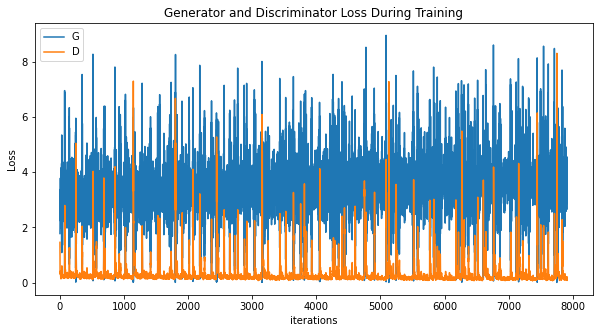

In [40]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

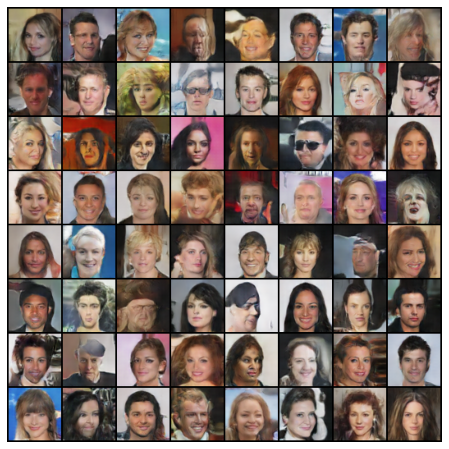

In [41]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [125]:
def model_inference_test(model, num_batches, batch_size=32):
    start_time = time.time()
    
    # conducts 1000 inference
    fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)
    generated_imgs = []
    with torch.no_grad():
        for i in range(1000):
            fake_imgs = new_netG(fixed_noise).detach().cpu()
            generated_imgs.extend(torch.split(fake_imgs, 1))

    print("Time: %d s for %d inferences" % (time.time() - start_time, num_batches * batch_size))

    fig, axs = plt.subplots(2, 2)
    axs[0, 0].imshow(torch.squeeze(generated_imgs[1]).permute(1, 2, 0))
    axs[0, 1].imshow(torch.squeeze(generated_imgs[12]).permute(1, 2, 0))
    axs[1, 0].imshow(torch.squeeze(generated_imgs[13]).permute(1, 2, 0))
    axs[1, 1].imshow(torch.squeeze(generated_imgs[16]).permute(1, 2, 0))

def print_size_of_model(model):
    torch.save(model.state_dict(), "temp.p")
    print('Size (MB):', os.path.getsize("temp.p")/1e6)
    os.remove('temp.p')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Time: 16 s for 32000 inferences
Size (MB): 14.318219


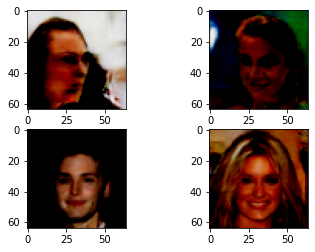

In [126]:
# raw model

new_netG = Generator(ngpu).to(device)
new_netG.load_state_dict(torch.load(dcgan_generator_path))
model_inference_test(new_netG, num_batches=1000)
print_size_of_model(new_netG)

QConfig(activation=functools.partial(<class 'torch.quantization.observer.MinMaxObserver'>, reduce_range=True), weight=functools.partial(<class 'torch.quantization.observer.MinMaxObserver'>, dtype=torch.qint8, qscheme=torch.per_tensor_symmetric))
Size (MB): 14.32121


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Time: 16 s for 32000 inferences


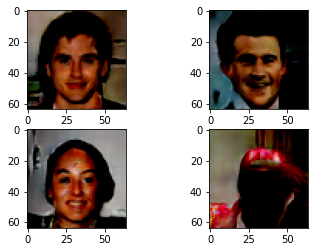

In [137]:
# quantize model
quantize_model = Generator(ngpu=1).to(device)
quantize_model.load_state_dict(torch.load(dcgan_generator_path))
quantize_model.qconfig = torch.quantization.default_qconfig
print(quantize_model.qconfig)
# prepare
torch.quantization.prepare(quantize_model, inplace=True)

# calibrate
for i in range(10):
    noise = torch.randn(batch_size, nz, 1, 1, device=device)
    quantize_model(noise)
    
torch.quantization.convert(quantize_model, mapping={torch.float32: torch.float16}, inplace=True)
print_size_of_model(quantize_model)

# qmodel = torch.quantization.quantize_dynamic(quantize_model, dtype=torch.qint8)
# torch.save(qmodel.state_dict(), "./dcgan_generator_int8.pt")

model_inference_test(quantize_model, num_batches=1000)